<a href="https://colab.research.google.com/github/OmdenaAI/philadelphia-climate-change-buildings/blob/main/src/tasks/task-2-EDA/task%202%20-%20test%20data%20EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

tl;dr
I analyzed the test set, following the notebook for the training set. I found the following:



*   Test is from one year (7), which doesn't occur at all in train.
*   Two-thirds of train is from state 6, which doesn't occur at all in test. 
*   The columns with a lot of missing data in train (3 wind columns and 1 days with fog column) are even more missing in test. (~55% v ~90%)
*   Test is significantly colder than train. Maybe because it has a higher average elevation. 
*   Elevation is a particularly strange column. It appears to change too much to be building elevation. I think it has to be however, for two reasons: it correlates positively with cold extremes and fog and state data (0.3-0.6) and negatively with higher temperatures (~-0.3). And the elevation minimum in train is -6. These correlations are from train data. Test data doesn't have as much variation and isn't as expressive.





### **Data preprocessing for the Test dataset**

In this notebook I'll look at the test dataset of the building data. I'll mostly just copy code directly from Rich and Salman's notebook for data cleaning of the train data, then compare the two results. 

# **Importing dependencies**

In [ ]:
# Arrays and DataFrames
import numpy as np  # deals with arrays i-e matrices
import pandas as pd  # deals with tabualr data

# Data Visualization
import matplotlib.pyplot as plt  # The most commonly used visualization library
import seaborn as sns  # it is Matplotlib under the hood. Handy for statistical plotting.
# It is a magic function that renders the figure in a notebook (instead of displaying a dump of the figure object).
%matplotlib inline   
import missingno as mno  # Library to visualize missing values in a column - works well if the number of columns are below 50 

# Feature selection tools and Encoders
import lightgbm
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import os

In [ ]:
os.getcwd()
os.listdir(os.getcwd())

test = pd.read_csv("/content/test.csv")
train = pd.read_csv("/content/train.csv")


# Checking out the data:

In [ ]:
# Looking at the first few rows
test.head()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,...,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,id
0,7,State_1,Commercial,Grocery_store_or_food_market,28484.0,1994.0,37.0,2.4,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75757
1,7,State_1,Commercial,Grocery_store_or_food_market,21906.0,1961.0,55.0,45.7,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75758
2,7,State_1,Commercial,Grocery_store_or_food_market,16138.0,1950.0,1.0,59.1,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75759
3,7,State_1,Commercial,Grocery_store_or_food_market,97422.0,1971.0,34.0,35.4,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75760
4,7,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,35.0,1.8,38,50.596774,...,0,29,5,2,0,340.0,330.0,22.8,126.0,75761


In [ ]:
# Check the shape of the test data
print(f"No. of rows in test are {test.shape[0]} and No. of columns in test are {test.shape[1]}")

No. of rows in test are 9705 and No. of columns in test are 63


(Train: No. of rows in train are 75757 and No. of columns in train are 64)

This is **different**! We have one less column in the test set, there is no SEUI column. We'll try to predict it. 
Our test set is about 13% the size of train (9705/75757).

In [ ]:
# Lets see the dtypes and null value distributions of all columns
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9705 entries, 0 to 9704
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year_Factor                9705 non-null   int64  
 1   State_Factor               9705 non-null   object 
 2   building_class             9705 non-null   object 
 3   facility_type              9705 non-null   object 
 4   floor_area                 9705 non-null   float64
 5   year_built                 9613 non-null   float64
 6   energy_star_rating         7451 non-null   float64
 7   ELEVATION                  9705 non-null   float64
 8   january_min_temp           9705 non-null   int64  
 9   january_avg_temp           9705 non-null   float64
 10  january_max_temp           9705 non-null   int64  
 11  february_min_temp          9705 non-null   int64  
 12  february_avg_temp          9705 non-null   float64
 13  february_max_temp          9705 non-null   int64

This is **different** from the training set (train: dtypes: float64(24), int64(37), object(3)). As noted above we are missing a float64 column, that would be the SEUI value. We have the same number of int and categorical columns.

In [ ]:
# % of null values
null_columns = pd.DataFrame(test[test.columns[test.isnull().any()]].isnull().sum() * 100 / test.shape[0], columns=['Percentage of NaN values'])
null_columns['Total NaN Values'] = test[test.columns[test.isnull().any()]].isnull().sum()
null_columns

,Percentage of NaN values,Total NaN Values
year_built,0.947965,92
energy_star_rating,23.225142,2254
direction_max_wind_speed,88.356517,8575
direction_peak_wind_speed,88.356517,8575
max_wind_speed,88.356517,8575
days_with_fog,93.941267,9117


How do these numbers compare with train?

**Train** (percentage NaN):
> year: 2.42

> esr: 35.3

> direction max wind speed 54.2

> direction peak wind speed 55.2

> max wind speed 54.2

> days with fog 60.5

So we have fewer missing years, and Salman suggested we delete these so we'll probably just delete this ~1% from the test set. Then we'll need to impute the remaining values. But there are significantly more NaNs in the test weather data, so will we combine the two sets to impute all these missing values together? 














In [ ]:
# Lets extract list of 
null_cols = null_columns.index.tolist()
print(type(null_cols))
null_cols

<class 'list'>


['year_built',
 'energy_star_rating',
 'direction_max_wind_speed',
 'direction_peak_wind_speed',
 'max_wind_speed',
 'days_with_fog']

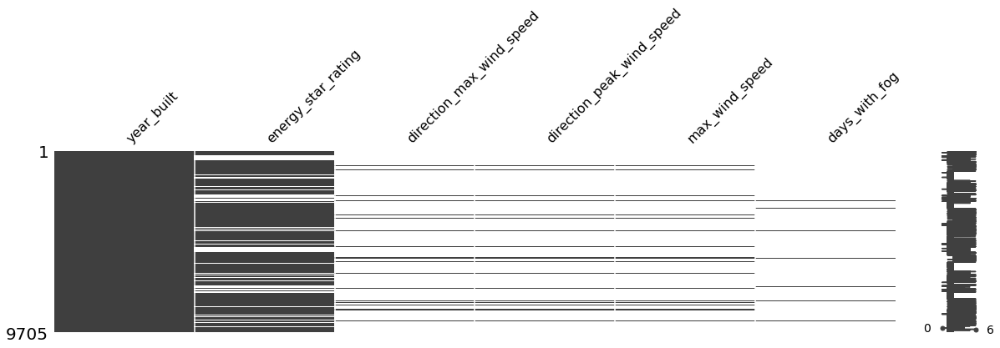

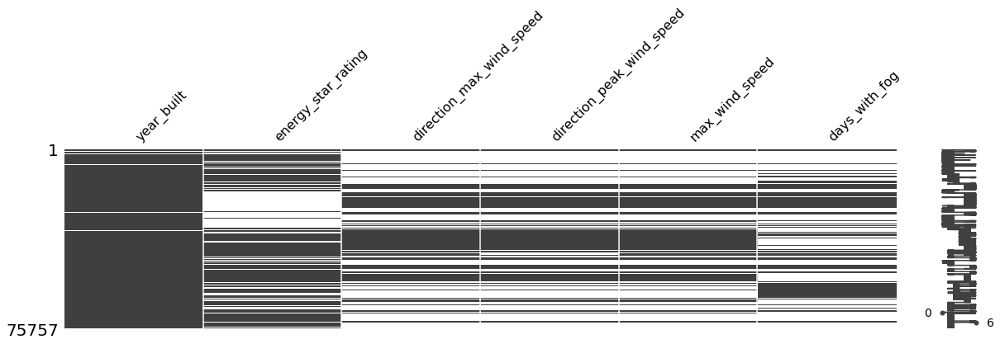

In [ ]:
# Visual representation of columns with missing values
import missingno as mno
mno.matrix(test[null_cols], figsize = (20, 4))
plt.show()
mno.matrix(train[null_cols], figsize = (20, 4))
plt.show()

The missingness in the test set, last 4 columns is apparent in the first graph. The second graph should just be train, identical to Rich/Salman's notebook, but it's only showing half the rows. I don't know why.

In [ ]:
# Lets look at descriptive statistics for the train DataFrame
# I am taking a transpose of describe() function so that it flips rows with columns
# .style shows all the rows of DataFrame
test.describe().T.style  

,count,mean,std,min,25%,50%,75%,max
Year_Factor,9705.000000,7.000000,0.000000,7.000000,7.000000,7.000000,7.000000,7.000000
floor_area,9705.000000,163214.325162,262475.879577,5982.000000,48020.000000,82486.000000,177520.000000,6353396.000000
year_built,9613.000000,1963.219598,40.819953,0.000000,1929.000000,1969.000000,1994.000000,2016.000000
energy_star_rating,7451.000000,64.712924,27.935984,1.000000,45.000000,72.000000,88.000000,100.000000
ELEVATION,9705.000000,205.231190,264.822814,1.800000,26.500000,118.900000,231.300000,812.000000
january_min_temp,9705.000000,13.520762,12.458365,-1.000000,-1.000000,15.000000,21.000000,38.000000
january_avg_temp,9705.000000,36.678081,6.968520,27.548387,27.548387,38.661290,41.177419,50.596774
january_max_temp,9705.000000,60.008449,5.874699,42.000000,54.000000,59.000000,64.000000,71.000000
february_min_temp,9705.000000,21.705100,9.774624,9.000000,9.000000,22.000000,28.000000,40.000000
february_avg_temp,9705.000000,41.634886,5.528689,33.428571,36.053571,41.625000,45.685185,54.482143


There must be a clever way to compare the two sets of descriptive statistics... 
By inspection, there are significant differences in some of the columns. 

In [ ]:
# Find duplicate entries
print(f"Duplicate entries: {test.duplicated().sum()}")

Duplicate entries: 0


No duplicate entries, **same** as train. 

In [ ]:
# Summarize the number of unique values in each column
pd.set_option('display.max_rows', None)  # This makes sure we can see all the rows

# nunique() counts the unique values in every column and dropna=True argument makes sure we ignore NaN
# .sort_values() sort the values in ascending order
print(test.nunique(dropna=True).sort_values())  

Year_Factor                     1
days_above_110F                 1
building_class                  2
days_above_100F                 2
days_below_0F                   2
days_below_10F                  4
august_max_temp                 4
august_min_temp                 5
march_max_temp                  5
september_max_temp              6
direction_max_wind_speed        6
direction_peak_wind_speed       6
days_below_20F                  6
october_max_temp                6
june_max_temp                   6
june_min_temp                   6
State_Factor                    6
april_min_temp                  7
december_max_temp               7
february_min_temp               7
october_min_temp                7
september_min_temp              7
days_above_90F                  7
july_max_temp                   7
july_min_temp                   7
days_with_fog                   7
february_max_temp               7
june_avg_temp                   8
days_above_80F                  8
january_min_te

Here's a clue about our data. There is only one value each for year_factor (7), days_above_110 (0). And avg_temp only has 8 unique values! Compared to 173 for train. 

It looks like test is all from one year, and probably the average elevation is higher (medians: 119 v 25). It doesn't get as hot. 

In [ ]:
!pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 305 kB/s 


                                             |          | [  0%]   00:00 -> (? left)


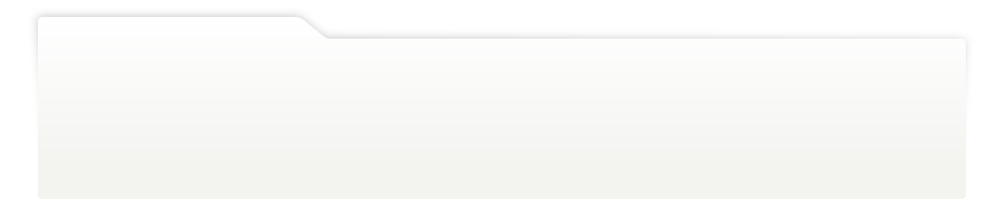
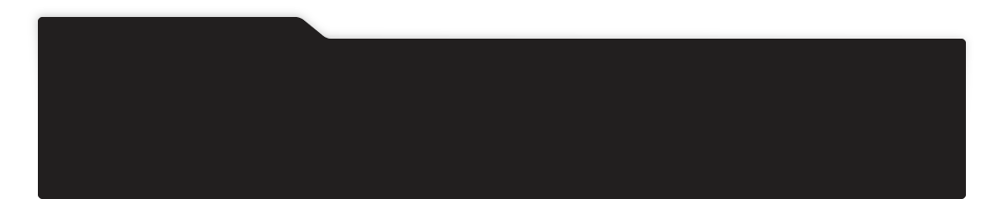
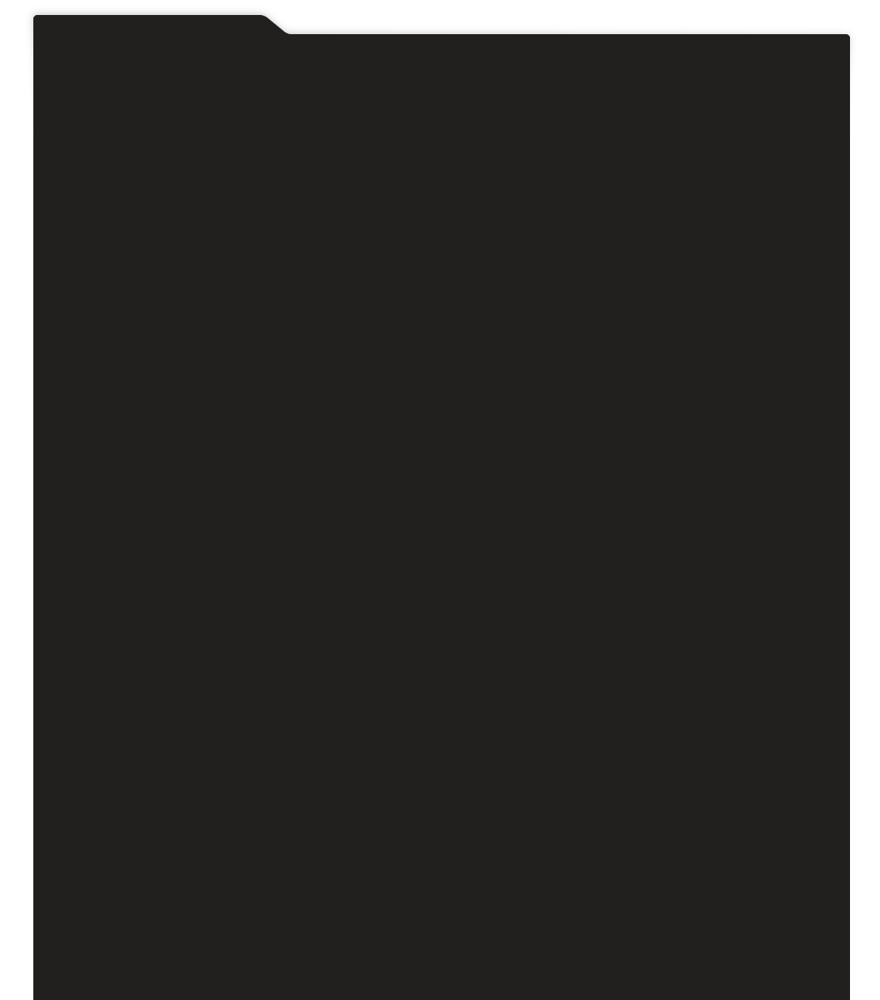
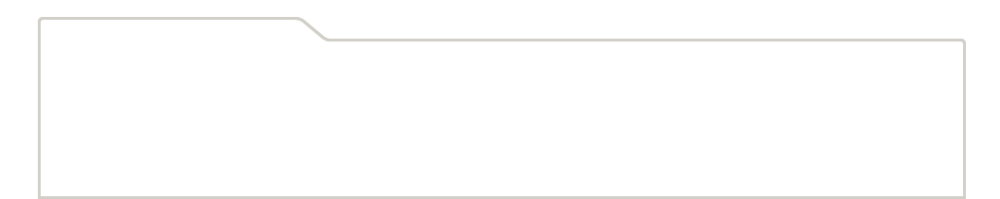
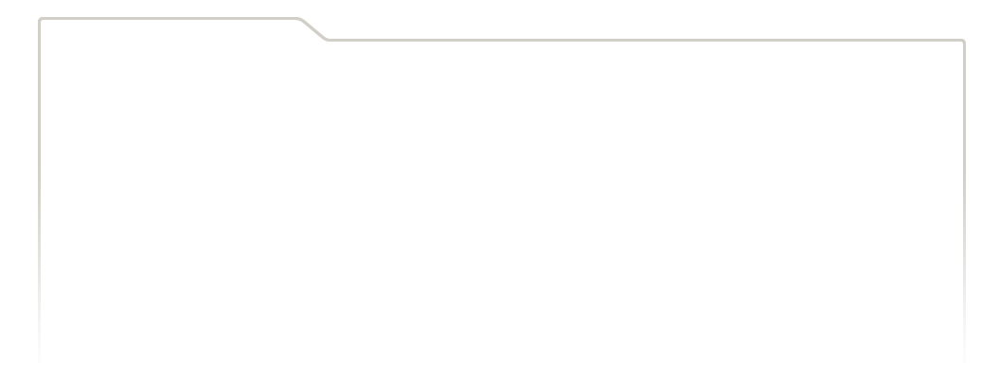
...
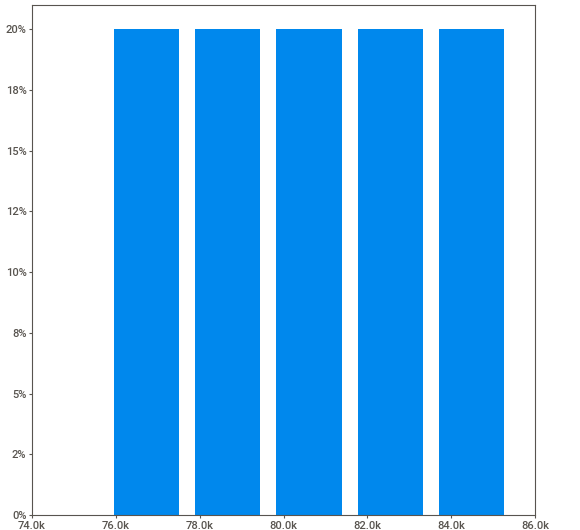
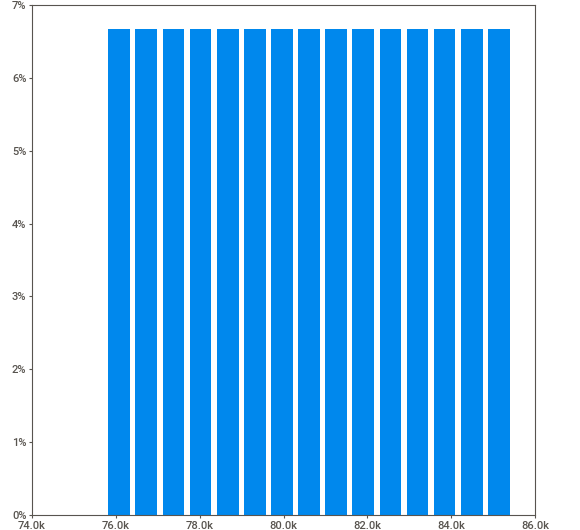
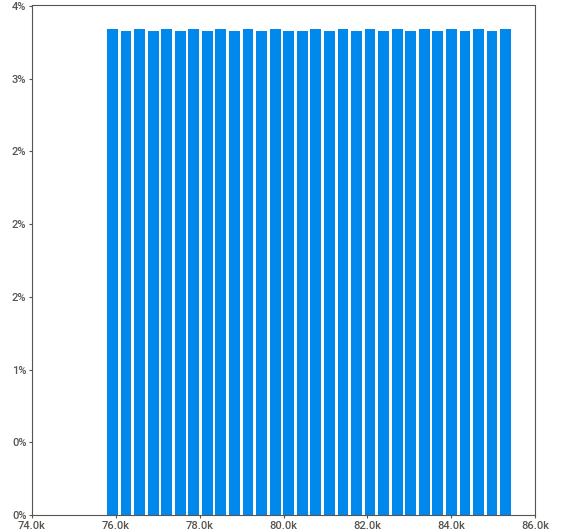
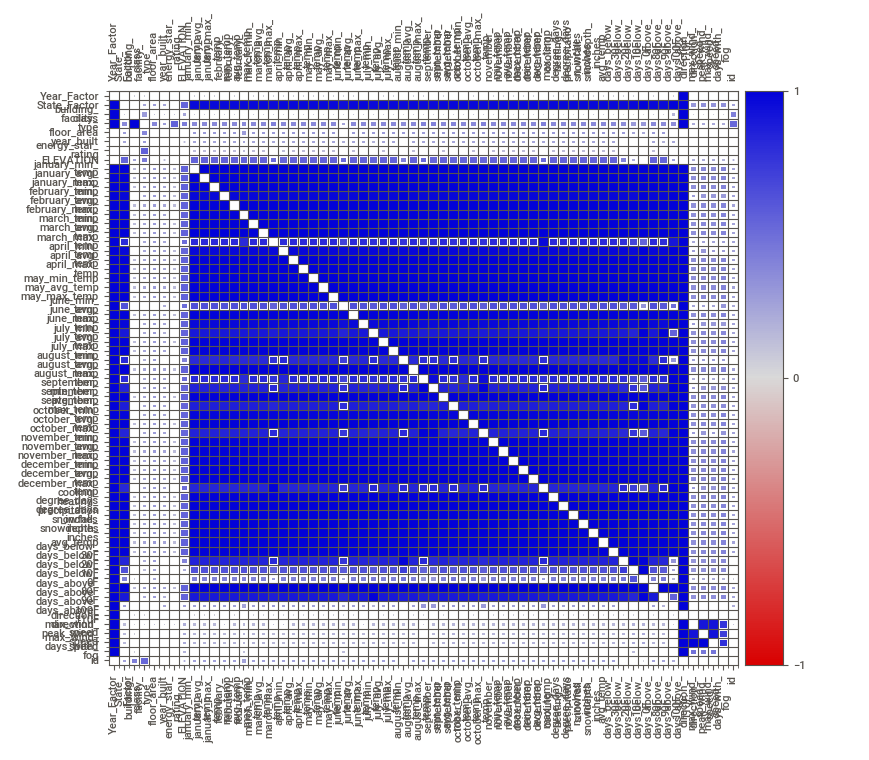
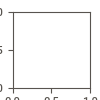

In [ ]:
import sweetviz as sv

my_report = sv.analyze(test)
my_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)


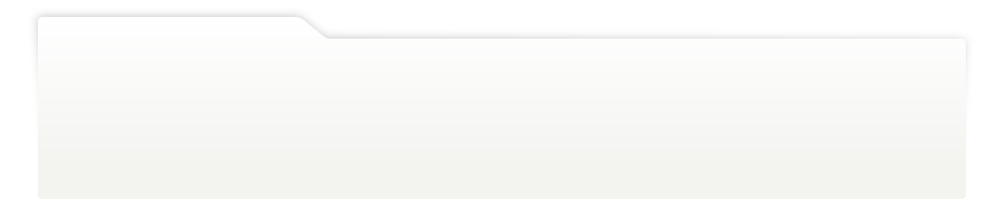
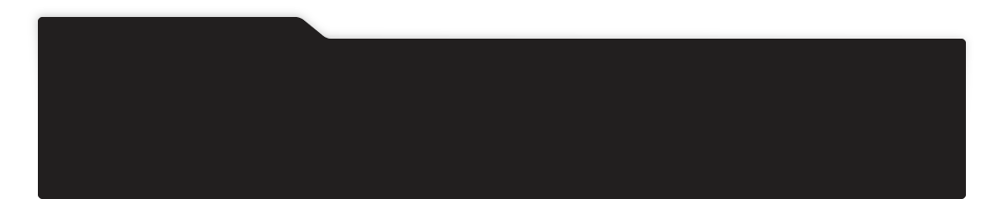
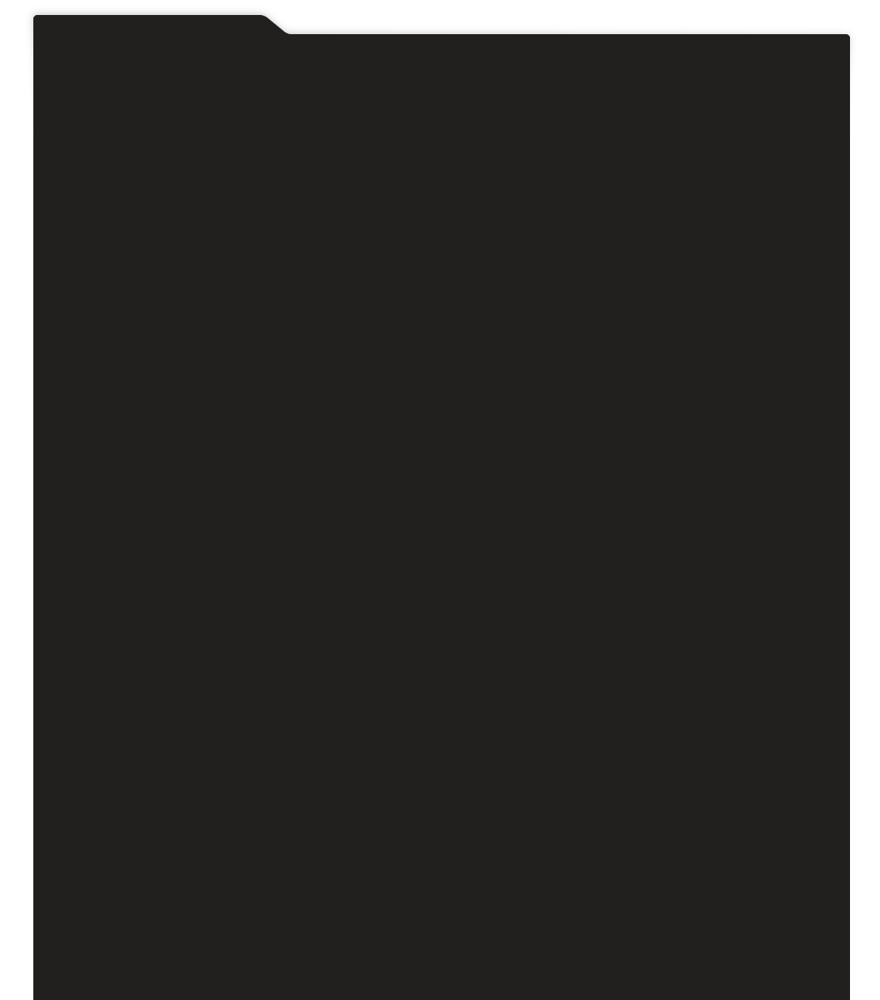
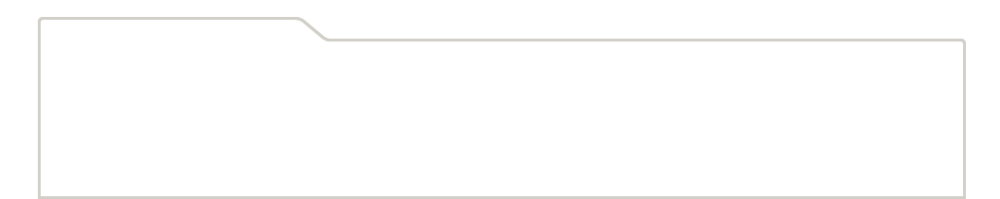
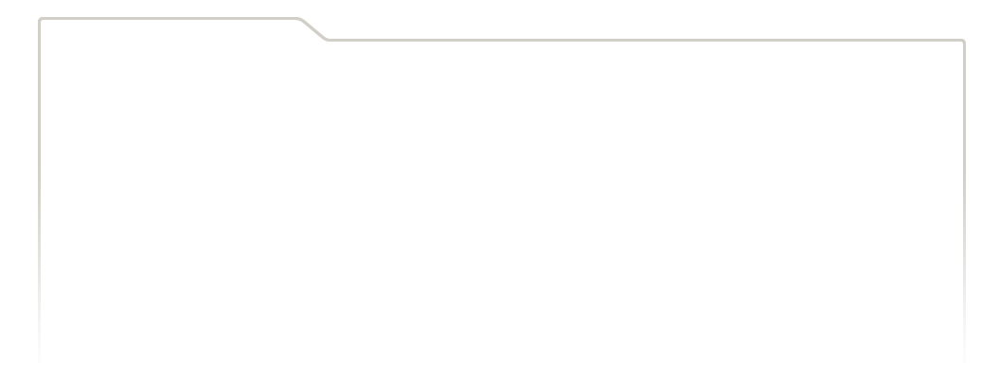
...
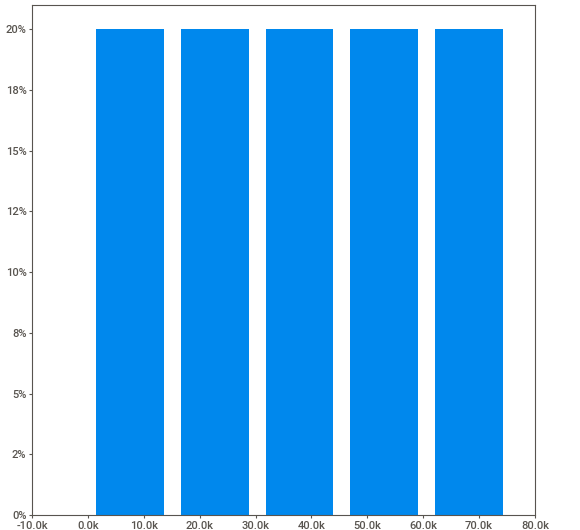
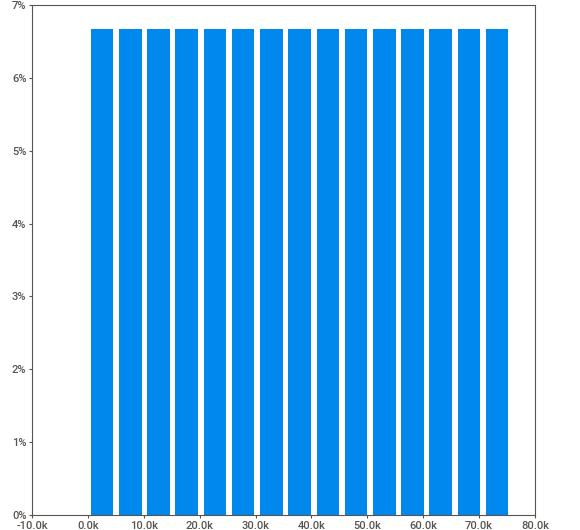
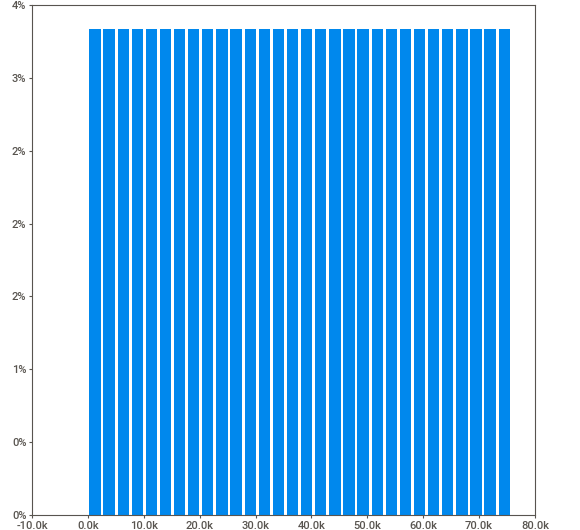
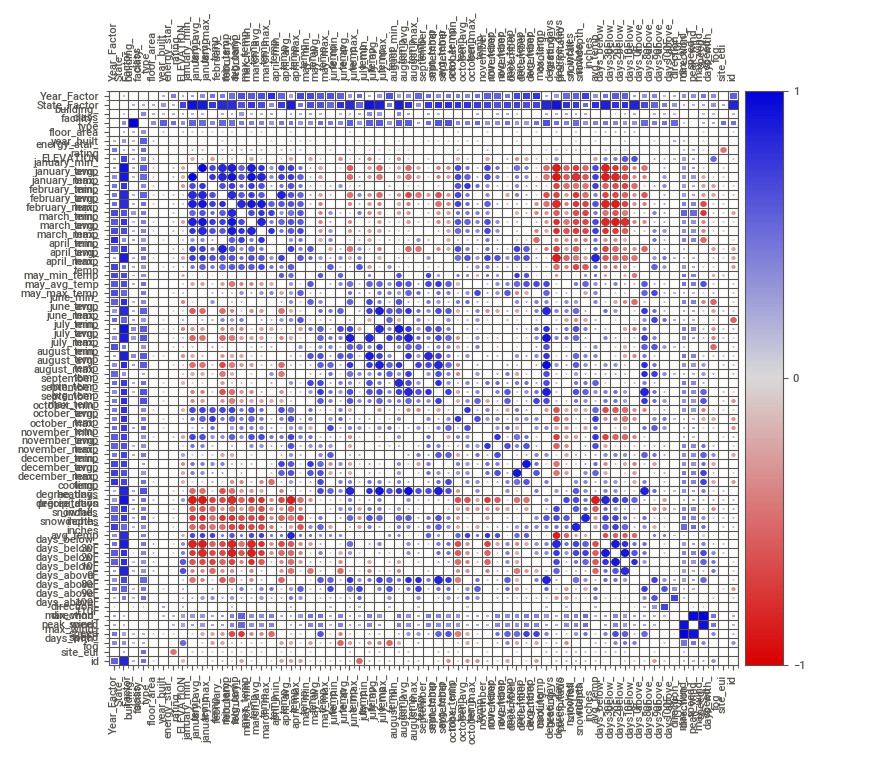
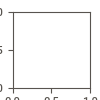

In [ ]:
my_report = sv.analyze(train)
my_report.show_notebook()

In [ ]:
# Making a seperate DataFrame for categorical and numerical features
categorical_features = ['State_Factor', 'building_class', 'facility_type']
numerical_features=train.select_dtypes('number').columns
train_cat = train[categorical_features].copy()
train_num = train[numerical_features].copy()
test_cat = train[categorical_features].copy()
test_num = train[numerical_features].copy()

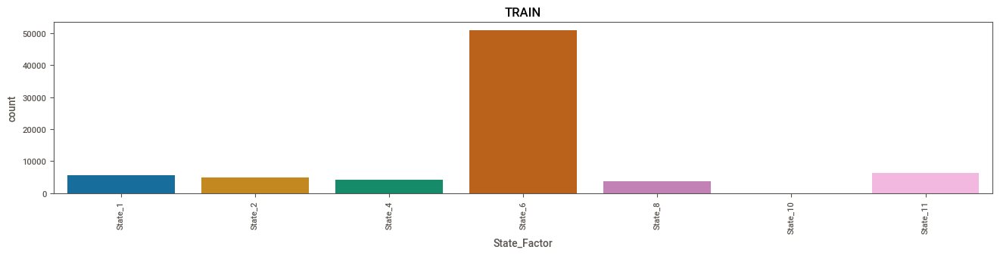

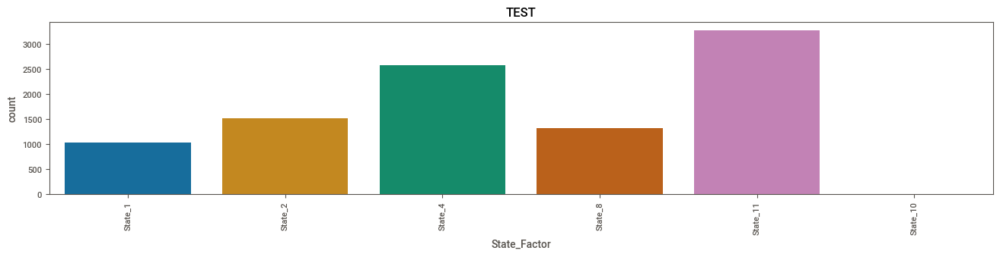

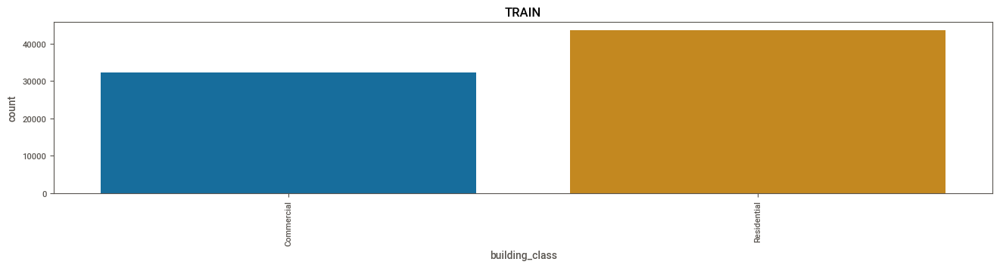

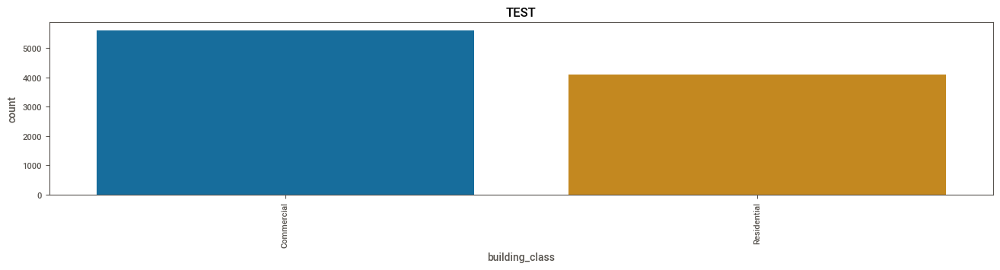

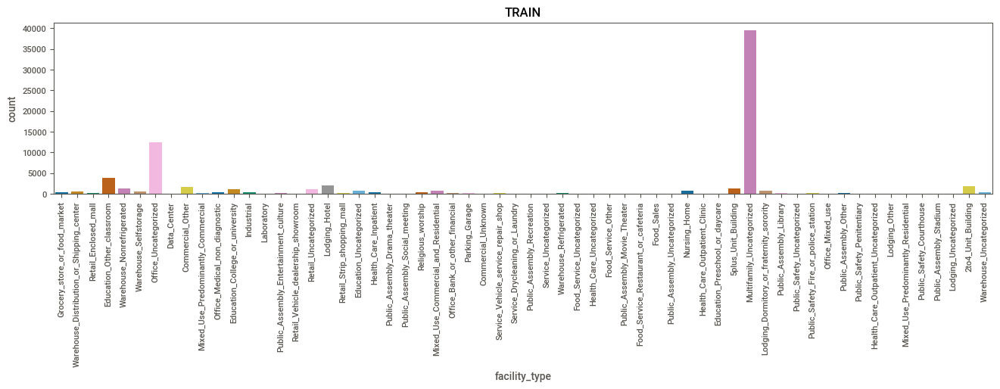

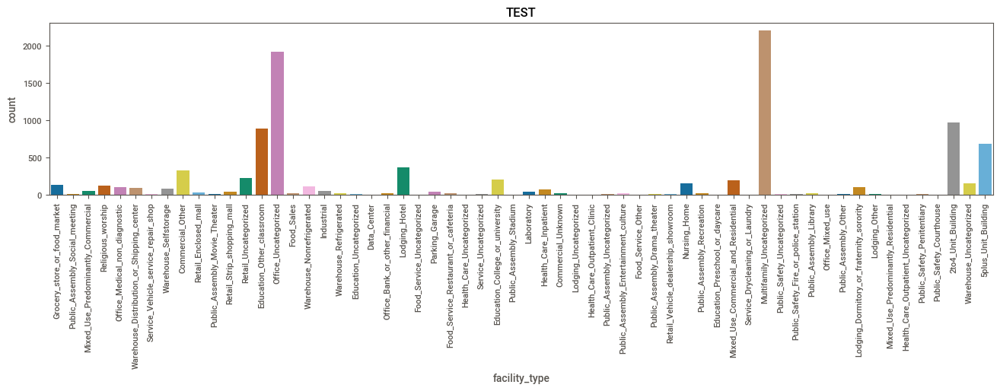

In [ ]:
#counts of the categorical data
def drawplot(col):
  plt.figure(figsize=(16,3))
  sns.countplot(x=train[col], palette = "colorblind").set(title="TRAIN")
  plt.xticks(rotation="vertical")

  plt.figure(figsize=(16,3))
  sns.countplot(x=test[col], palette = "colorblind").set(title="TEST")
  plt.xticks(rotation="vertical")

view = train_cat

for col in train_cat:
  drawplot(col)

(I don't know how to make stacked bar graphs.)

In the first pair we see that while state 6 accounts for two-thirds of train, it's absent in test. In the second the commercial/residential proportion is opposite in the two sets, but comparable. Finally, in the third pair it seems like the biggest categories from train match test, though the labels are disordered... 

Elevation in our data is a mystery. Here are 4 entries from the two sets that must be the same building. But there are 3 values of ELEVATION that change drastically. There is an alternate definition of elevation to do with architectural design, but it doesn't seem possible given the correlations I noted above. If anyone has a clue, please let me know. 

In [ ]:
# print rows with floor_area = 10149
building = train.loc[train["floor_area"] == 10149]
building_test = test.loc[test["floor_area"] == 10149]
print('FROM TRAIN\n', building[['Year_Factor', 'State_Factor', 'building_class', 'floor_area', 'year_built', 'ELEVATION', 'site_eui']])
print('\n\nFROM TEST\n', building_test[['Year_Factor', 'State_Factor', 'building_class', 'floor_area', 'year_built', 'ELEVATION']])

FROM TRAIN
       Year_Factor State_Factor building_class  floor_area  year_built  \
1456            3      State_1     Commercial     10149.0      1931.0   
2673            4      State_1     Commercial     10149.0      1931.0   
3769            5      State_1     Commercial     10149.0      1931.0   

      ELEVATION  site_eui  
1456       45.7       6.8  
2673      120.4       8.2  
3769       59.1      12.3  


FROM TEST
      Year_Factor State_Factor building_class  floor_area  year_built  \
320            7      State_1     Commercial     10149.0      1931.0   

     ELEVATION  
320       59.1  
